In [497]:
import pybliometrics.scopus as sc
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from collections import Counter
from jaal import Jaal
import csv
import itertools


In [561]:
print(sc.config['Authentication']['APIKey'])

f6c57a21e7ed8c221ae032a29677cf81


In [554]:
pd.set_option('display.max_colwidth', None)

In [553]:
t = sc.ScopusSearch("AF-ID(60033125) AND PUBYEAR IS " + '2023',verbose=True, download=True).results
for tup in t:
    print(tup.type())
    break

AttributeError: 'Document' object has no attribute 'type'

In [2]:
articles = {}

In [3]:
years = ['2016','2017', '2018', '2019', '2020', '2021', '2022', '2023']

In [555]:
for year in years:
    articles[year] = pd.DataFrame(pd.DataFrame(sc.ScopusSearch("AF-ID(60033125) AND PUBYEAR IS " + year,verbose=True, download=True).results))

In [5]:
articles.keys()

dict_keys(['2016', '2017', '2018', '2019', '2020', '2021', '2022', '2023'])

In [6]:
articles['2016']

,eid,doi,pii,pubmed_id,title,subtype,subtypeDescription,creator,afid,affilname,...,pageRange,description,authkeywords,citedby_count,openaccess,freetoread,freetoreadLabel,fund_acr,fund_no,fund_sponsor
0,2-s2.0-85116225936,None,None,None,Why do emotions matter in museums and heritage...,ch,Book Chapter,Watson S.,60033125,University of Leicester,...,75-91,None,None,9,0,None,None,None,undefined,None
1,2-s2.0-85007508412,10.1186/s13601-016-0137-4,None,None,ARIA 2016: Care pathways implementing emerging...,re,Review,Bousquet J.,60276907;60257836;60249936;60113487;60108527;6...,Uniwersytecki Szpital Kliniczny Nr 1 im. Norbe...,...,None,The Allergic Rhinitis and its Impact on Asthma...,AIRWAYS ICPs | ARIA | EIP on AHA | ICT | Mobil...,118,1,repositoryam,Green,FP7,261357,Seventh Framework Programme
2,2-s2.0-85015904524,10.2168/LMCS-12(4:7)2016,None,None,Honesty by typing,ar,Article,Bartoletti M.,60033125;60032259;60015986;60015150,University of Leicester;Università degli Studi...,...,None,We propose a type system for a calculus of con...,Contract-oriented computing | Session types | ...,8,1,repositoryam,Green,FP7,295261,Seventh Framework Programme
3,2-s2.0-85009445500,10.1103/PhysRevLett.117.273001,None,None,Anionic Hydrogen Cluster Ions as a New Form of...,ar,Article,Renzler M.,60033125;60030718;60009999,University of Leicester;Freie Universität Berl...,...,None,We report the first experimental observation o...,None,25,0,repositoryvor,Green,FWF,I978,Austrian Science Fund
4,2-s2.0-85006967256,10.1002/2016JD025090,None,None,The performance of the EarthCARE cloud profili...,ar,Article,Burns D.,60033125;60009037;60002494,University of Leicester;Jet Propulsion Laborat...,...,14525-14537,Marine stratiform clouds are a challenging tar...,None,15,0,repositoryvor,Green,NASA,nceo020006,National Aeronautics and Space Administration
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2333,2-s2.0-84941286999,10.1016/j.cretres.2015.08.010,S0195667115300537,None,Costacopluma (Decapoda: Brachyura: Retroplumid...,ar,Article,Hyžný M.,60071540;60033125;60028311;60023578;60020292;6...,Universite Cheikh Anta Diop;University of Leic...,...,142-156,Newly collected decapod material from the Cap ...,Cuticle microstructure | Decapoda | K/Pg bound...,8,0,None,None,APVV,APVV-0436-12,Agentúra na Podporu Výskumu a Vývoja
2334,2-s2.0-84940899446,10.1016/j.chb.2015.06.041,S0747563215004811,None,Editorial for the CHB special issue on MMOGs,ed,Editorial,Christou G.,60104630;60077474;60033125;60025063;60002146,European University Cyprus;Cyprus University o...,...,515-516,None,None,0,0,None,None,None,undefined,None
2335,2-s2.0-84939599954,10.1016/j.jecp.2015.06.017,S0022096515001642,26298433,Children's use of interventions to learn causa...,ar,Article,McCormack T.,60033125;60029738;60022148,University of Leicester;Queen's University Bel...,...,1-22,Children between 5 and 8. years of age freely ...,Active learning | Bayesian modelling | Causal ...,39,1,repositoryvor,Green,ESRC,ES/G030634/1,Economic and Social Research Council
2336,2-s2.0-84938099940,10.1007/978-3-319-21133-6_11,None,None,Dispersive flies optimisation and medical imaging,ar,Article,al-Rifaie M.M.,60171766;60010964,"College of Life Sciences;Goldsmiths, Universit...",...,183-203,One of the main sources of inspiration for tec...,Dispersive flies optimisation | Mammographs | ...,12,0,repositoryam,Green,None,undefined,None


In [538]:
articles['2023']

,eid,doi,pii,pubmed_id,title,subtype,subtypeDescription,creator,afid,affilname,affiliation_city,affiliation_country,author_count,author_names,author_ids,author_afids,coverDate,coverDisplayDate,publicationName,issn,source_id,eIssn,aggregationType,volume,issueIdentifier,article_number,pageRange,description,authkeywords,citedby_count,openaccess,freetoread,freetoreadLabel,fund_acr,fund_no,fund_sponsor
0,2-s2.0-85153912961,10.1186/s12936-023-04566-7,None,37101295,Retinal imaging technologies in cerebral malar...,re,Review,Wilson K.J.,60274452;60097413;60072678;60033125;60030565;6...,Kamuzu University of Health Sciences;MSU Colle...,Blantyre;East Lansing;Blantyre;Leicester;Liver...,Malawi;United States;Malawi;United Kingdom;Uni...,8,"Wilson, Kyle J.;Dhalla, Amit;Meng, Yanda;Tu, Z...",58062955300;58063050300;57219445528;5721889586...,60020661-60072678;60024453;60020661;60033125;6...,2023-12-01,December 2023,Malaria Journal,None,22911,14752875,Journal,22,1,139,None,Background: Cerebral malaria (CM) continues to...,Cerebral malaria | Fluorescein angiography | F...,0,1,repositoryam,Green,None,undefined,None
1,2-s2.0-85153809791,10.1186/s12870-023-04217-8,None,37098475,The mitochondrial genome of the diploid oat Av...,ar,Article,Liu Q.,60171766;60032203;60030948;60027363;60019499;1...,College of Life Sciences;South China Agricultu...,Leicester;Guangzhou;Guangzhou;Beijing;Beijing;...,United Kingdom;China;China;China;China;China,7,"Liu, Qing;Yuan, Hongyu;Xu, Jiaxin;Cui, Dongli;...",57077115800;57555873300;58201656400;5738267390...,60030948-100449801-60019499;60030948-100449801...,2023-12-01,December 2023,BMC Plant Biology,None,16794,14712229,Journal,23,1,218,None,Background: Avena longiglumis Durieu (2n = 2x ...,Avena longiglumis | Chloroplast | Genome recom...,0,1,publisherfullgold,Gold,NSFC,32070359,National Natural Science Foundation of China
2,2-s2.0-85153772216,10.1186/s12909-023-04165-9,None,37088814,Why might medical student empathy change throu...,ar,Article,Howick J.,60033125;60025111;60017977;60010756,University of Leicester;The University of Nort...,Leicester;Chapel Hill;Leicester;Hanover,United Kingdom;United States;United Kingdom;Un...,8,"Howick, Jeremy;Dudko, Maya;Feng, Shi Nan;Ahmed...",26221816200;57974126600;57974068300;5797424300...,60017977;60017977;60025111;60017977;60010756;6...,2023-12-01,December 2023,BMC Medical Education,None,28099,14726920,Journal,23,1,270,None,Background: Several studies suggest that medic...,Communication | Education | Empathy | Medical ...,0,1,publisherfullgold,Gold,UoL,undefined,University of Leicester
3,2-s2.0-85153555703,10.1186/s12874-023-01925-5,None,37087450,Hierarchical network meta-analysis models for ...,ar,Article,Hussein H.,60163091;60033125;60016418,"Faculty of Science, Engineering and Medicine;U...",Coventry;Leicester;York,United Kingdom;United Kingdom;United Kingdom,6,"Hussein, Humaira;Abrams, Keith R.;Gray, Laura ...",57204624319;58196367500;55543158100;5720758411...,60033125;60163091-60016418;60033125;60016418;6...,2023-12-01,December 2023,BMC Medical Research Methodology,None,28110,14712288,Journal,23,1,97,None,Background: With the increased interest in the...,Bias adjustment | Evidence synthesis | Hierarc...,0,1,publisherfullgold,Gold,MRC,MR/R025223/1,Pfizer
4,2-s2.0-85153540620,10.1186/s40168-023-01533-x,None,37085924,Gauge your phage: benchmarking of bacteriophag...,ar,Article,Ho S.F.S.,60171766;60033481,College of Life Sciences;University of Birming...,Leicester;Birmingham,United Kingdom;United Kingdom,4,"Ho, Siu Fung Stanley;Wheeler, Nicole E.;Millar...",57222312351;57768862200;7005085267;6701570816,60033481;60033481;60171766;60033481,2023-12-01,December 2023,Microbiome,None,21100401152,20492618,Journal,11,1,84,None,Background: The prediction of bacteriophage se...,Bacteriophage | Benchmarking | Machine learnin...,0,1,publisherfullgold,Gold,MRC,215154/Z/18/Z,Medical Research Council
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...

In [556]:
articles['2023'][articles['2023'].pubmed_id == '36914875']

,eid,doi,pii,pubmed_id,title,subtype,subtypeDescription,creator,afid,affilname,affiliation_city,affiliation_country,author_count,author_names,author_ids,author_afids,coverDate,coverDisplayDate,publicationName,issn,source_id,eIssn,aggregationType,volume,issueIdentifier,article_number,pageRange,description,authkeywords,citedby_count,openaccess,freetoread,freetoreadLabel,fund_acr,fund_no,fund_sponsor
385,2-s2.0-85150122193,10.1038/s41588-023-01314-0,None,36914875,Multi-ancestry genome-wide association analyses improve resolution of genes and pathways influencing lung function and chronic obstructive pulmonary disease risk,ar,Article,Shrine N.,60183191;60177635;60175886;60171764;60171138;60113880;60110825;60090173;60089816;60084490;60072750;60068590;60033316;60033182;60033125;60032499;60032114;60031806;60031741;60031101;60030846;60028717;60028652;60028548;60027565;60027561;60027272;60026952;60025898;60024007;60023588;60023146;60022786;60022323;60021334;60019295;60018701;60018478;60016782;60016660;60015618;60015183;60015138;60013148;60013141;60012914;60012516;60010973;60009969;60009171;60007997;60007652;60006385;60004573;60002952;60002746;60002634;60001001;60000291;60000096;125946854;123354817;112566928,"School of Medicine and Public Health;Faculty of Life Sciences &amp; Medicine;MRC Centre for Environment and Health;Bristol Medical School;University of Dundee School of Medicine;Hamad Bin Khalifa University, College of Health and Life Sciences;Edinburgh Medical School;The Faculty of Health Sciences;Hunter Medical Research Institute, Australia;PathWest Laboratory Medicine WA;Weill Cornell Medicine-Qatar;Universitair Ziekenhuis Gent;Universiteit Gent;University of Michigan Medical School;University of Leicester;Harvard T.H. Chan School of Public Health;Erasmus MC;The University of Western Australia;Westat, Inc.;University of Cambridge;University of Virginia School of Medicine;Ludwig-Maximilians-Universität München;National Institute of Environmental Health Sciences (NIEHS);University of Washington School of Medicine;Columbia University Irving Medical Center;University of Illinois at Chicago;The University of Edinburgh;Mayo Clinic Scottsdale-Phoenix, Arizona;Sir Charles Gairdner Hospital;Helmholtz Center Munich German Research Center for Environmental Health;Universitat Basel;Swiss Tropical and Public Health Institute (Swiss TPH);Universitätsmedizin Greifswald;Clinical Trial Service Unit and Epidemiological Studies Unit;University of Arizona College of Medicine – Tucson;Karolinska Universitetssjukhuset;School of Public Health;Queen Elizabeth II Medical Centre Trust;Brigham and Women's Hospital;University of Michigan School of Public Health;Leids Universitair Medisch Centrum;Keck School of Medicine of USC;University of Nottingham;UCL Institute of Ophthalmology;Norges Teknisk-Naturvitenskapelige Universitet;MRC Human Genetics Unit;University of Texas School of Public Health;University of Edinburgh, College of Medicine and Veterinary Medicine;MRC Epidemiology Unit;Glenfield Hospital;Weill Cornell Medicine;Old Dominion University;Boston University School of Medicine;Peking University Health Science Center;Helsingin Yliopisto;Harvard Medical School;University of Oxford Medical Sciences Division;Broad Institute;Klinikum der Universität München;Telethon Kids Institute;German Center for Lung Research (DZL);COPD Foundation;Nord-Trøndelag Hospital Trust","Callaghan;London;London;Bristol;Dundee;Doha;Edinburgh;Perth;Newcastle;Perth;Education City;Ghent;Ghent;Ann Arbor;Leicester;Boston;Rotterdam;Perth;Rockville;Cambridge;Charlottesville;Munich;Research Triangle Park;Seattle;New York;Chicago;Edinburgh;Scottsdale;Perth;Neuherberg;Basel;Basel;Greifswald;Oxford;Tucson;Stockholm;Boston;Perth;Boston;Ann Arbor;Leiden;Los Angeles;Nottingham;London;Trondheim;Edinburgh;Houston;Edinburgh;Cambridge;Leicester;New York;Norfolk;Boston;Beijing;Helsinki;Boston;Oxford;Cambridge;Munich;Perth;Munich;Washington, D.C.;Levanger",Australia;United Kingdom;United Kingdom;U

**below gives the keywaord cloud for a particular year for the whole University**

In [562]:
ab = sc.AbstractRetrieval("2-s2.0-85150122193", view='FULL')

[Author(auid=57611606200, indexed_name='Shrine N.', surname='Shrine', given_name='Nick', affiliation='60033125'),
 Author(auid=57318340600, indexed_name='Izquierdo A.G.', surname='Izquierdo', given_name='Abril G.', affiliation='60033125'),
 Author(auid=57224917295, indexed_name='Chen J.', surname='Chen', given_name='Jing', affiliation='60033125'),
 Author(auid=15043116600, indexed_name='Packer R.', surname='Packer', given_name='Richard', affiliation='60033125'),
 Author(auid=57193208606, indexed_name='Hall R.J.', surname='Hall', given_name='Robert J.', affiliation='60015138'),
 Author(auid=55915282600, indexed_name='Guyatt A.L.', surname='Guyatt', given_name='Anna L.', affiliation='60033125'),
 Author(auid=23666331700, indexed_name='Batini C.', surname='Batini', given_name='Chiara', affiliation='60033125;60009171'),
 Author(auid=57682682100, indexed_name='Thompson R.J.', surname='Thompson', given_name='Rebecca J.', affiliation='60015138'),
 Author(auid=57776369700, indexed_name='Pavulu

C:\Users\cdv1\PycharmProjects\Scopus\venv\lib\site-packages\wordcloud\wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


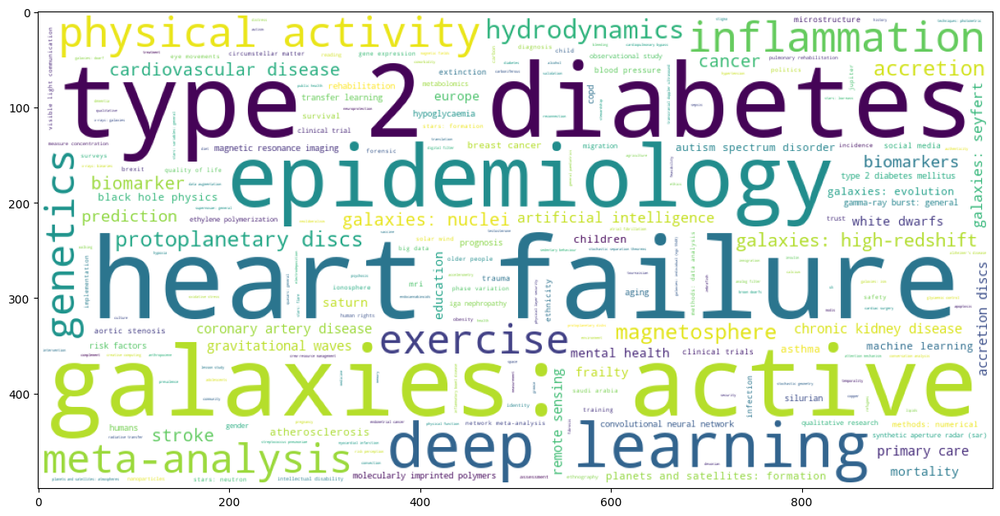

In [7]:
year = '2019'
kwc = {}
for index, row in articles[year].iterrows():
    kw = row.authkeywords
    if kw != None:
        kw = kw.split('|')
        for k in kw:
            k = k.strip()
            k = k.lower()
            if k in kwc.keys():
                kwc[k] += 1
            else:
                kwc[k] = 1
del(kwc['systematic review'])
for key in list(kwc):
    if kwc[key] <= 2:
        del(kwc[key])
# print(sorted(kwc.items(), key=lambda x:x[1]))
wordcloud = WordCloud(width = 1000, height = 500, background_color='white', max_words=500, margin=10).generate_from_frequencies(kwc)

plt.figure(figsize=(15,8))
plt.imshow(wordcloud)

In [8]:
kwc['COVID-19']

KeyError: 'COVID-19'

C:\Users\cdv1\PycharmProjects\Scopus\venv\lib\site-packages\wordcloud\wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


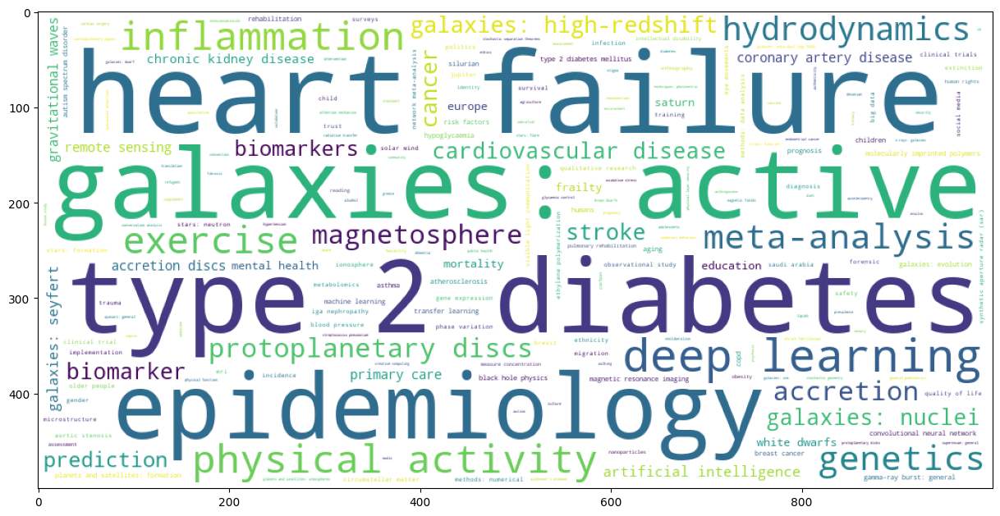

In [9]:
wordcloud = WordCloud(width = 1000, height = 500, background_color='white', max_words=500, margin=10).generate_from_frequencies(kwc)

plt.figure(figsize=(15,8))
plt.imshow(wordcloud)

In [10]:
#ab = sc.ScopusSearch("AFFIL(University of Leicester), KEY(AI OR machine learning), PUBYEAR IS 2022",verbose=True, download=True)

In [11]:
#df =pd.DataFrame(pd.DataFrame(ab.results))
#df

In [13]:
#pd.options.display.max_columns = None
#articles['2019']

In [14]:
# years = ['2016','2017','2018','2019','2020','2021','2022','2023']
# lauthors = {}
# oauthors = {}
# pubs = {}
# for year in years:
#     print(year)
#     for index, row in articles[year].iterrows():
#         kwc = {}
#         if row.author_afids == None: # may need to check for creator to keep those ones
#             print('warn',row)
#             continue
#         afids = row.author_afids.split(';')
#         auth = row.author_names.split(';')
#         authids = row.author_ids.split(';')
#         kw = row.authkeywords
#         if kw != None:
#             kw = kw.split('|')
#             for k in kw:
#                 k = k.strip()
#                 k = k.lower()
#                 if k in kwc.keys():
#                     kwc[k] += 1
#                 else:
#                     kwc[k] = 1
#         count = 0
#         for af in afids:
#             if '60033125' in af.split('-'):
#                 author = auth[count]
#                 authorid = authids[count]
#                 if authorid in lauthors.keys():
#                     lauthors[authorid]['title'].append(row.title)
#                     lauthors[authorid]['eid'].append(row.eid)
#                     lauthors[authorid]['kwc'] = dict(Counter(lauthors[authorid]['kwc']) + Counter(kwc))
#                 else:
#                     lauthors[authorid] = {}
#                     lauthors[authorid]['author'] = author
#                     lauthors[authorid]['kwc'] = kwc
#                     lauthors[authorid]['title']=[row.title]
#                     lauthors[authorid]['eid']=[row.eid]
#
#
#
#             count += 1


In [566]:
years = ['2016','2017','2018','2019','2020','2021','2022','2023']
lauthors = {}
lpubauth = {}
oauthors = {}
pubs = {}
authafs = {}
for year in years:
    print(year)
    for index, row in articles[year].iterrows():
        #get keywords for that article, put into array and remove leading and trailing spaces
        kwt = row.authkeywords
        kw = []
        if kwt != None:
            for k in kwt.split('|'):
                kw.append(k.strip())
        #create dictionary for each publication
        pubs[row.eid] = {'title': row.title, 'journal': row.publicationName, 'type': row.subtypeDescription, 'citations': row.citedby_count, 'year': row.coverDate, 'kw':kw}

        #need to check what is happening here as scopus does know they are leicester publications
        if row.author_afids == None: # may need to check for creator to keep those ones
            print('warn no affiliation ids',row)
            continue
        afids = row.author_afids.split(';')
        auth = row.author_names.split(';')
        authids = row.author_ids.split(';')

        # loop through each affiliation id and place into dictionaries for leicester authors, other authors, pub/leicester auth.
        count = 0
        for af in afids:
            author = auth[count]
            authorid = authids[count]
            if '60033125' in af.split('-'):   #leicester authors
                if authorid in lauthors.keys():
                    lauthors[authorid].append({'author':author,'kw':kw, 'eid':row.eid , 'title':row.title})
                else:
                    lauthors[authorid] = []
                    lauthors[authorid].append({'author':author,'kw':kw, 'eid':row.eid , 'title':row.title})

                if row.eid in lpubauth.keys():
                    lpubauth[row.eid].append({'author':author, 'id': authorid, 'kw': kw, 'affils': af.split('-')})
                else:
                    lpubauth[row.eid] = []
                    lpubauth[row.eid].append({'author':author, 'id': authorid, 'kw': kw, 'affils': af.split('-')})
                if authorid in authafs:
                    authafs[authorid] = list(set(authafs[authorid] + af.split('-')))
                else:
                    authafs[authorid] = []
                    authafs[authorid] = list(set(af.split('-')))

            else:
                if row.eid in oauthors.keys():
                    oauthors[row.eid].append({'author':author, 'affils': af.split('-')})
                else:
                    oauthors[row.eid] = []
                    oauthors[row.eid].append({'author':author, 'affils': af.split('-')})
                if authorid in authafs:
                    authafs[authorid] = list(set(authafs[authorid] + af.split('-')))
                else:
                    authafs[authorid] = []
                    authafs[authorid] = list(set(af.split('-')))
            count += 1



2016
2017
2018
2019
warn no affiliation ids eid                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                         

In [567]:
lpubauth

{'2-s2.0-85116225936': [{'author': 'Watson, Sheila',
   'id': '56419308200',
   'kw': [],
   'affils': ['60033125']}],
 '2-s2.0-85007508412': [{'author': 'Brightling, C. E.',
   'id': '54790515400',
   'kw': ['AIRWAYS ICPs',
    'ARIA',
    'EIP on AHA',
    'ICT',
    'Mobile technology',
    'Rhinitis'],
   'affils': ['60028485', '60033125']}],
 '2-s2.0-85015904524': [{'author': 'Tuosto, Emilio',
   'id': '8967981400',
   'kw': ['Contract-oriented computing', 'Session types', 'Verification'],
   'affils': ['60033125']}],
 '2-s2.0-85009445500': [{'author': 'Ellis, Andrew M.',
   'id': '7201547132',
   'kw': [],
   'affils': ['60033125']}],
 '2-s2.0-85006967256': [{'author': 'Battaglia, Alessandro',
   'id': '9537045600',
   'kw': [],
   'affils': ['60033125']}],
 '2-s2.0-85006411024': [{'author': 'Bown, Matthew J.',
   'id': '7003652591',
   'kw': ['coronary heart disease',
    'genetics',
    'phenome-wide association study',
    'single nucleotide polymorphism'],
   'affils': ['6003

In [534]:
lpubauth['s41588-023-01314-0']

KeyError: 's41588-023-01314-0'

In [490]:
oauthors

{'2-s2.0-85007508412': [{'author': 'Bousquet, J.',
   'affils': ['60031773', '118780867', '60106201', '60017438']},
  {'author': 'Hellings, P. W.', 'affils': ['60025063']},
  {'author': 'Agache, I.', 'affils': ['60023654']},
  {'author': 'Bedbrook, A.', 'affils': ['118780867']},
  {'author': 'Bachert, C.', 'affils': ['60068590']},
  {'author': 'Bergmann, K. C.', 'affils': ['60026245', '110095546']},
  {'author': 'Bewick, M.', 'affils': ['117522057']},
  {'author': 'Bindslev-Jensen, C.', 'affils': ['60015591']},
  {'author': 'Bosnic-Anticevitch, S.', 'affils': ['60025709']},
  {'author': 'Bucca, C.', 'affils': ['122477318']},
  {'author': 'Caimmi, D. P.', 'affils': ['60031773']},
  {'author': 'Camargos, P. A.M.', 'affils': ['60030074']},
  {'author': 'Canonica, G. W.', 'affils': ['60107210']},
  {'author': 'Casale, T.', 'affils': ['60007740']},
  {'author': 'Chavannes, N. H.', 'affils': ['60015618']},
  {'author': 'Cruz, A. A.', 'affils': ['60013710', '115902638']},
  {'author': 'De Car

In [568]:
authkeys = {}
pubtogether = []
for p in lpubauth:
    auths = []
    for a in lpubauth[p]:
        auths.append(a['id'])
        if len(a['kw'])>0:
            if a['id'] not in authkeys.keys():
                authkeys[a['id']] = {}
            for k in a['kw']:
                if k in authkeys[a['id']].keys():
                    authkeys[a['id']][k] += 1
                else:
                    authkeys[a['id']][k] = 1
    if len(auths)>1:
        pubtogether = pubtogether + list(itertools.combinations(auths,2))

In [572]:
authkeys

{'54790515400': {'AIRWAYS ICPs': 2,
  'ARIA': 3,
  'EIP on AHA': 2,
  'ICT': 1,
  'Mobile technology': 1,
  'Rhinitis': 3,
  'Asthma': 18,
  'Exacerbation': 3,
  'Fourfold': 1,
  'Inhaled corticosteroids': 1,
  'Oral corticosteroids Randomised controlled trial': 1,
  'Primary care': 1,
  'Protocol': 1,
  'Self-management plan': 1,
  'Adult-onset': 1,
  'Asthma duration': 1,
  'Childhood-onset': 1,
  'Elderly': 1,
  'Inflammatory biomarker': 1,
  'C-reactive protein': 1,
  'COPD': 18,
  'eosinophils': 4,
  'exacerbations': 2,
  'hospitalizations': 1,
  'treatment': 1,
  'Chronic respiratory diseases': 1,
  'European Innovation Partnership on Active and Healthy Ageing': 1,
  'MACVIA': 1,
  'Scaling up': 1,
  'Airway smooth muscle': 1,
  'NOX4': 2,
  'Oxidative stress': 1,
  'Reactive oxygen species': 1,
  'asthma': 18,
  'exacerbation': 5,
  'interleukin-5': 1,
  'Mepolizumab': 2,
  'epithelial cells': 2,
  'oxidative stress': 1,
  'airway remodeling': 2,
  'asthma-COPD overlap syndrome'

In [570]:
ptogc = {}
for tup in pubtogether:
    tupr = (tup[1],tup[0])
    if tup in ptogc.keys():
        ptogc[tup] += 1
    if tupr in ptogc.keys():
        ptogc[tupr] += 1
    else:
        ptogc[tup] = 1

In [571]:
ptogc

{('7003652591', '6507266975'): 1,
 ('7003652591', '7004345054'): 1,
 ('6507266975', '7004345054'): 1,
 ('9333419400', '57192170303'): 1,
 ('9333419400', '7403478934'): 1,
 ('9333419400', '7006253164'): 1,
 ('57192170303', '7403478934'): 1,
 ('57192170303', '7006253164'): 1,
 ('7403478934', '7006253164'): 1,
 ('20836017400', '10242315100'): 2,
 ('12809549000', '10239471100'): 1,
 ('57192429971', '56797529500'): 1,
 ('57192429971', '6507072067'): 1,
 ('57192429971', '7006769658'): 1,
 ('56797529500', '6507072067'): 1,
 ('56797529500', '7006769658'): 1,
 ('6507072067', '7006769658'): 1,
 ('24469807000', '7102997492'): 5,
 ('24469807000', '7005906085'): 1,
 ('7102997492', '7005906085'): 4,
 ('56385307700', '7003436141'): 1,
 ('56385307700', '8570427200'): 1,
 ('7003436141', '8570427200'): 2,
 ('7003996757', '57021216200'): 1,
 ('7003996757', '7409118844'): 1,
 ('7003996757', '7202809721'): 1,
 ('7003996757', '57202486438'): 1,
 ('57021216200', '7409118844'): 1,
 ('57021216200', '7202809721

In [ ]:
afs = []
for auth in authafs:
    afs = list(set(afs + authafs[auth]))
authafsT = {}

for af in afs:
    if af == '':
        continue
    try:
        afr = sc.AffiliationRetrieval(af)
    except:
        continue
    if af in authafsT.keys():
        authafsT[af].append({'name': afr.affiliation_name, 'country': afr.country})
    else:
            authafsT[af] = []
            authafsT[af].append({'name': afr.affiliation_name, 'country': afr.country})


In [17]:
oauthors['2-s2.0-84959911934']

[{'author': 'Sullo, Nikol', 'affils': ['60171766', '60026777']},
 {'author': 'Matteis, Maria', 'affils': ['60026777']},
 {'author': 'Spaziano, Giuseppe', 'affils': ['60026777']},
 {'author': 'McDonald, John', 'affils': ['60171766']},
 {'author': 'Urbanek, Konrad', 'affils': ['60026777']},
 {'author': 'De Angelis, Antonella', 'affils': ['60026777']},
 {'author': 'De Palma, Raffaele', 'affils': ['60026777']},
 {'author': 'Rossi, Francesco', 'affils': ['60026777']},
 {'author': 'Guerrini, Remo', 'affils': ['60024690']},
 {'author': 'Calò, Girolamo', 'affils': ['60024690']},
 {'author': "D'Agostino, Bruno", 'affils': ['60026777']},
 {'author': 'Lambert, David G.', 'affils': ['60171766']}]

In [18]:
print(sc.AffiliationRetrieval('60171766').name_variants)

[Variant(name='College Of Life Sciences', doc_count=1604), Variant(name='Department Of Cardiovascular Sciences', doc_count=762), Variant(name='Diabetes Research Centre', doc_count=515), Variant(name='Department Of Genetics And Genome Biology', doc_count=345), Variant(name='Cancer Biomarkers And Prevention Group', doc_count=147), Variant(name='Leicester Diabetes Centre', doc_count=119), Variant(name='University Of Leicester', doc_count=94), Variant(name='College Of Medicine', doc_count=52), Variant(name='Cardiovascular Sciences', doc_count=25), Variant(name='Leicester Diabetes Research Centre', doc_count=24)]


In [19]:
# lauthors = {}
# lpubauth = {}
# oauthors = {}
# pubs = {}
# authafs = {}
# afs = []

In [20]:
def getaffilsbypub(authdict, afinfo, pub):
    retar = []
    for el in authdict[pub]:
        for af in el['affils']:
            if af != '':
                try:
                    retar.append(afinfo[af])
                except:
                    continue
    return retar


In [ ]:

getaffilsbypub(oauthors, authafsT, '2-s2.0-84959911934')

In [ ]:
pubs['2-s2.0-84959911934']

In [ ]:
for auth in lauthors.keys():
    print(lauthors[auth][0]['author'])
    for pub in lauthors[auth]:
        print(pub)
        try:
            for oa in oauthors[pub['eid']]:
                print(oa['author'])
        except Exception as e:
            print(e)

In [ ]:
afs

In [25]:
kwscloud = {}
for pub in lauthors[list(lauthors.keys())[1]]:
    for kw in pub['kw']:
        kw = kw.lower()
        if kw in kwscloud.keys():
            kwscloud[kw]+=1
        else:
            kwscloud[kw]=1


In [ ]:
brcinv = []
with open('C:\\Users\cdv1\PycharmProjects\Scopus\BRC.csv') as csvfile:
    csv_reader = csv.reader(csvfile)
    headers = next(csv_reader)
    for row in csv_reader:
        row_data = {key: value for key, value in zip(headers, row)}
        brcinv.append(row_data)


In [ ]:
brcinv

In [28]:
kwscloud = {}
kwscloud['all'] = {}

for inv in brcinv:
    if inv['ï»¿Theme '] not in kwscloud:
        kwscloud[inv['ï»¿Theme ']] = {}
    if inv['Surname'] == '' or inv['Forename'] == '':
        continue
    name = inv['Surname'] + ', ' + inv['Forename'][0]
    for auth in lauthors:
        authpres = False
        for art in lauthors[auth]:
            if name in art['author']:
                authpres = True
                break
        if authpres:
            for art in lauthors[auth]:
                for kw in art['kw']:
                    kw = kw.lower()
                    if kw in kwscloud[inv['ï»¿Theme ']].keys():
                        kwscloud[inv['ï»¿Theme ']][kw]+=1
                    else:
                        kwscloud[inv['ï»¿Theme ']][kw]=1
                    if kw in kwscloud['all'].keys():
                        kwscloud['all'][kw]+=1
                    else:
                        kwscloud['all'][kw]=1


with these dictionaries, we can search:
for leicester author - get list of pubs, get list of keywords per pub for counting, etc
then can get leicester collaborators by pub
other authors and affiliations by pub

with a pool of names or groupings can extract pub ids and then create word clouds etc

caveat, this is only for publications in scopus, not new or non published collaborations
other authors represent all on a paper not necessarily close collaborations
hard to remove duplicates of people with different scopus ids

need to convert affiliation ids



C:\Users\cdv1\PycharmProjects\Scopus\venv\lib\site-packages\wordcloud\wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


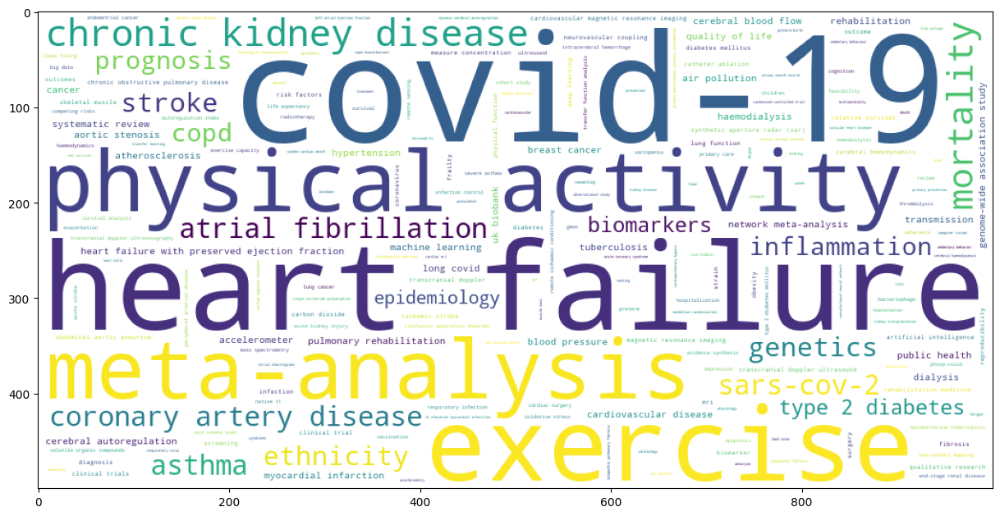

In [29]:
wordcloud = WordCloud(width = 1000, height = 500, background_color='white', max_words=1000, margin=10).generate_from_frequencies(kwscloud['all'])

plt.figure(figsize=(15,8))
plt.imshow(wordcloud)

In [30]:
uolstaff = pd.read_csv('Z:\\Downloads\\address.csv')

In [31]:
uolstaff

,Title,First Name,Middle Name,Last Name,Suffix,Company,Department,Job Title,Business Street,Business Street 2,Business Street 3,Business City,Business State,Business Postal Code,Business Country/Region,Home Street,Home Street 2,Home Street 3,Home City,Home State,Home Postal Code,Home Country/Region,Other Street,Other Street 2,Other Street 3,Other City,Other State,Other Postal Code,Other Country/Region,Assistant's Phone,Business Fax,Business Phone,Business Phone 2,Callback,Car Phone,Company Main Phone,Home Fax,Home Phone,Home Phone 2,ISDN,Mobile Phone,Other Fax,Other Phone,Pager,Primary Phone,Radio Phone,TTY/TDD Phone,Telex,Account,Anniversary,Assistant's Name,Billing Information,Birthday,Business Address PO Box,Categories,Children,Directory Server,E-mail Address,E-mail Type,E-mail Display Name,E-mail 2 Address,E-mail 2 Type,E-mail 2 Display Name,E-mail 3 Address,E-mail 3 Type,E-mail 3 Display Name,Gender,Government ID Number,Hobby,Home Address PO Box,Initials,Internet Free Busy,Keywords,Language,Location,Manager's Name,Mileage,Notes,Office Location,Organizational ID Number,Other Address PO Box,Priority,Private,Profession,Referred By,Sensitivity,Spouse,User 1,User 2,User 3,User 4,Web Page
0,NaN,Sadegh,NaN,Abadijou,NaN,NaN,LS: Genetics & Genome Biology,Staff,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ma1023,0/0/00,NaN,NaN,0/0/00,NaN,NaN,NaN,NaN,/o=ExchangeLabs/ou=Exchange Administrative Gro...,EX,"Abadijou, Sadegh (ma1023@leicester.ac.uk)",NaN,NaN,NaN,NaN,NaN,NaN,Unspecified,NaN,NaN,NaN,S.A.,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Normal,False,NaN,NaN,Normal,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,Andy,NaN,Abbott,NaN,NaN,SE/CH: Materials & Interfaces,Staff,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,+44 116 252 2087,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,apa1,0/0/00,NaN,NaN,0/0/00,NaN,NaN,NaN,NaN,/o=ExchangeLabs/ou=Exchange Administrative Gro...,EX,"Abbott, Andy (Prof.) (apa1@leicester.ac.uk)",NaN,NaN,NaN,NaN,NaN,NaN,Unspecified,NaN,NaN,NaN,A.A.,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Normal,False,NaN,NaN,Normal,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,Ruksar,NaN,Abdala,NaN,NaN,LS: Population Health Sciences,Staff,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ra421,0/0/00,NaN,NaN,0/0/00,NaN,NaN,NaN,NaN,/o=ExchangeLabs/ou=Exchange Administrative Gro...,EX,"Abdala, Ruksar (ra421@leicester.ac.uk)",NaN,NaN,NaN,NaN,NaN,NaN,Unspecified,NaN,NaN,NaN,R.A.,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Normal,False,NaN,NaN,Normal,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,Arwa,NaN,Abdel-Aal,NaN,NaN,LS: Medicine,Staff,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,aaa154,0/0/00,NaN,NaN,0/0/00,NaN,NaN,NaN,NaN,/o=ExchangeLabs/ou=Exchange Administrative Gro...,EX,"Abdel-Aal, Arwa (Dr.) (aaa154@leicester.ac.uk)",NaN,NaN,NaN,NaN,NaN,NaN,Unspecified,NaN,NaN,NaN,A.A.,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Normal,False,NaN,NaN,Normal,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,Ruqia,NaN,Abdi,NaN,NaN,ECS: Campus Services,Staff,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,rma27,0/0/00,NaN,NaN,0/0/00,NaN,NaN,NaN,NaN,/o=ExchangeLabs/ou=Exchange Administrative Gro...,EX,"Abdi, Ruqia (rma27@leicester.ac.uk)",NaN,NaN,NaN,NaN,NaN,NaN,Unspecified,NaN,NaN,NaN,R.A.,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Normal,False,NaN,NaN,Normal,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,..

In [ ]:
print(uolstaff['Department'].where(uolstaff['Last Name'] == 'Abadijou'))

In [39]:
lauthors['7202582743']['author'].split(',')[0]

TypeError: list indices must be integers or slices, not str

In [196]:
for pub in oauthors:
    print(len(oauthors[pub]))

99
3
5
4
35
15
15
53
30
4
39
5
1
9
2
7
19
7
99
5
10
1
25
1
8
7
7
2
1
2
4
3
1
1
1
1
1
3
6
1
10
21
8
2
8
2
4
2
4
3
4
4
10
3
1
6
2
1
1
1
8
6
1
20
4
12
1
18
4
3
1
1
7
1
8
8
42
7
4
2
9
7
5
6
1
3
6
2
3
4
2
2
1
1
3
4
6
3
5
7
1
12
1
4
4
16
2
3
4
2
11
11
6
6
4
2
1
6
1
100
10
1
5
6
37
2
8
4
4
12
2
3
6
1
13
14
9
2
18
1
2
2
1
11
1
1
6
7
2
7
3
1
1
1
2
1
10
1
5
11
2
26
2
7
29
3
4
1
2
11
100
100
3
2
5
3
2
4
18
5
1
1
15
1
1
8
16
1
4
13
2
6
5
2
2
2
4
2
6
5
3
1
5
5
5
4
2
12
3
2
1
16
10
8
6
1
7
2
37
1
7
6
1
1
1
5
1
5
1
2
6
2
5
12
5
2
3
1
3
16
4
2
2
6
1
1
10
1
7
6
1
1
2
1
15
4
75
1
4
11
100
100
99
99
100
99
9
1
9
1
12
6
1
1
3
5
1
17
6
3
7
7
3
2
10
2
5
13
1
5
12
15
1
13
4
96
1
21
13
3
8
2
2
1
2
2
4
1
1
3
1
6
3
93
97
100
13
1
2
3
2
1
6
3
6
4
1
1
2
13
6
1
5
6
9
3
4
6
5
1
1
3
1
14
3
6
100
2
7
3
7
4
3
2
7
1
2
16
4
8
56
3
12
9
3
9
9
4
1
16
10
21
2
1
3
5
3
98
4
4
13
7
11
6
6
11
1
4
1
2
5
5
56
13
8
6
12
4
17
2
2
10
6
1
1
14
5
5
2
8
1
2
6
6
8
3
1
16
6
2
3
7
9
1
36
8
5
3
3
2
6
5
6
2
13
2
15
4
6
4
7
5
3
2
7
1
2
5
2


In [165]:
publauths = {}
for auth in lauthors:
    authn = lauthors[auth][0]['author']
    for pub in lauthors[auth]:
        if pub['eid'] in publauths.keys():
            publauths[pub['eid']].append(authn)
        else:
            publauths[pub['eid']] = []
            publauths[pub['eid']].append(authn)



In [485]:
publauths

{'2-s2.0-85116225936': ['Watson, Sheila'],
 '2-s2.0-85026700582': ['Watson, Sheila'],
 '2-s2.0-85030548984': ['Watson, Sheila'],
 '2-s2.0-85059197992': ['Watson, Sheila', 'Barnes, Amy Jane', 'Bunning, Katy'],
 '2-s2.0-85059179340': ['Watson, Sheila'],
 '2-s2.0-85059173262': ['Watson, Sheila'],
 '2-s2.0-85059157718': ['Watson, Sheila', 'Barnes, Amy Jane', 'Bunning, Katy'],
 '2-s2.0-85059156621': ['Watson, Sheila', 'Barnes, Amy Jane', 'Bunning, Katy'],
 '2-s2.0-85059153055': ['Watson, Sheila'],
 '2-s2.0-85059124352': ['Watson, Sheila'],
 '2-s2.0-85095917976': ['Watson, Sheila'],
 '2-s2.0-85095924410': ['Watson, Sheila'],
 '2-s2.0-85007508412': ['Brightling, C. E.'],
 '2-s2.0-84996487059': ['Brightling, C. E.'],
 '2-s2.0-84992109614': ['Brightling, C. E.', 'Wilson, Andrew'],
 '2-s2.0-84994524493': ['Brightling, C. E.', 'Russell, Richard'],
 '2-s2.0-84991608254': ['Brightling, C. E.'],
 '2-s2.0-84989904460': ['Brightling, C. E.',
  'Wardlaw, Andrew J.',
  'Siddiqui, Salman',
  'Gonem, Sher

In [291]:
import itertools
edge_df = pd.DataFrame(columns = ['from','to'])

for pub in publauths:
    if len(publauths[pub])>1:
        pairs = list(itertools.combinations(publauths[pub],2))
        for p in pairs:
            td = {'from':p[0], 'to':p[1]}
            edge_df = pd.concat([edge_df, pd.DataFrame([td])], ignore_index=True)
edge_df = edge_df.drop_duplicates()

In [307]:
'Watson' in authn

True

In [462]:
counter = 0

node_df = pd.DataFrame(columns = ['id','type'])
edge_df = pd.DataFrame(columns = ['from','to'])

leic = False
ext = False
kws = True

# target = 'Burton, J'

for auth in lauthors:
    authn = lauthors[auth][0]['author']
    if authn not in testauths or 'Brightling' in authn or 'Robinson' in authn:
        continue
    td = {'id':authn, 'type':'Leicester'}
    node_df = pd.concat([node_df, pd.DataFrame([td])], ignore_index=True)
    for pub in lauthors[auth]:

        if len(publauths[pub['eid']])>1 and leic:
            pairs = list(itertools.combinations(publauths[pub['eid']],2))
            for p in pairs:
                td = {'from':p[0], 'to':p[1]}
                edge_df = pd.concat([edge_df, pd.DataFrame([td])], ignore_index=True)
                # only need the below if not processing all leicester authors
                td = {'id':p[0], 'type':'Leicester'}
                node_df = pd.concat([node_df, pd.DataFrame([td])], ignore_index=True)
                td = {'id':p[1], 'type':'Leicester'}
                node_df = pd.concat([node_df, pd.DataFrame([td])], ignore_index=True)

        if pub['eid'] in oauthors.keys():
            if len(oauthors[pub['eid']])>10:
                continue
        # td = {'from':pub['eid'],'to':pub['author']}
        # td = {'from':pub['eid'],'to':authn}
        # edge_df = pd.concat([edge_df, pd.DataFrame([td])], ignore_index=True)

        if pub['eid'] in oauthors.keys() and ext:
            # if len(oauthors[pub['eid']])<10:
            for oauth in oauthors[pub['eid']]:
                    # td = {'from':pub['author'], 'to':oauth['author']}
                td = {'from':authn, 'to':oauth['author']}
                edge_df = pd.concat([edge_df, pd.DataFrame([td])], ignore_index=True)
                td = {'id':oauth['author'], 'type':'External'}
                node_df = pd.concat([node_df, pd.DataFrame([td])], ignore_index=True)

        # td = {'from':pub['eid'],'to':pub['title']}
        # edge_df = pd.concat([edge_df, pd.DataFrame([td])], ignore_index=True)

        if len(pub['kw'])>0 and kws:
            for kw in pub['kw']:
                td = {'from':authn, 'to':kw}
                edge_df = pd.concat([edge_df, pd.DataFrame([td])], ignore_index=True)
                td = {'id':kw, 'type':'KeyWord'}
                node_df = pd.concat([node_df, pd.DataFrame([td])], ignore_index=True)

        # for kw in pub['kw']:
        #     td = {'from':pub['author'],'to':kw}
        #     edge_df = pd.concat([edge_df, pd.DataFrame([td])], ignore_index=True)
    counter += 1
    if counter == 30:
        break

edge_df = edge_df.drop_duplicates()
node_df = node_df.drop_duplicates()

In [463]:
edge_df

,from,to
0,"Bown, Matthew J.",Abdominal aortic aneurysm
1,"Bown, Matthew J.",England
2,"Bown, Matthew J.",National Health Service
3,"Bown, Matthew J.",Women
5,"Bown, Matthew J.",Cancer
...,...,...
2927,"Symonds, R. Paul",personalised medicine
2928,"Symonds, R. Paul",qualitative research
2929,"Symonds, R. Paul",radiogenomics
2930,"Symonds, R. Paul",radiotherapy


In [345]:
pd.set_option('display.max_rows', 500)
# node_df
burtonauths = []
for index, row in node_df.iterrows():
    if row['type'] == 'Leicester':
        burtonauths.append(row['id'])

In [464]:
Jaal(edge_df, node_df).plot()

Parsing the data...Done
Dash is running on http://127.0.0.1:8050/

 * Serving Flask app '__main__'
 * Debug mode: off


 * Running on http://127.0.0.1:8050
Press CTRL+C to quit
127.0.0.1 - - [05/Oct/2023 16:38:14] "GET / HTTP/1.1" 200 -
127.0.0.1 - - [05/Oct/2023 16:38:14] "GET /_dash-layout HTTP/1.1" 200 -
127.0.0.1 - - [05/Oct/2023 16:38:14] "GET /_dash-dependencies HTTP/1.1" 200 -
127.0.0.1 - - [05/Oct/2023 16:38:14] "GET /_favicon.ico?v=2.10.0 HTTP/1.1" 200 -
127.0.0.1 - - [05/Oct/2023 16:38:18] "POST /_dash-update-component HTTP/1.1" 200 -
127.0.0.1 - - [05/Oct/2023 16:38:18] "POST /_dash-update-component HTTP/1.1" 200 -
127.0.0.1 - - [05/Oct/2023 16:38:18] "POST /_dash-update-component HTTP/1.1" 200 -
127.0.0.1 - - [05/Oct/2023 16:38:18] "POST /_dash-update-component HTTP/1.1" 200 -
127.0.0.1 - - [05/Oct/2023 16:38:18] "POST /_dash-update-component HTTP/1.1" 200 -


No trigger


127.0.0.1 - - [05/Oct/2023 16:38:36] "POST /_dash-update-component HTTP/1.1" 200 -


inside color node type


127.0.0.1 - - [05/Oct/2023 16:38:40] "POST /_dash-update-component HTTP/1.1" 200 -
127.0.0.1 - - [05/Oct/2023 16:38:44] "POST /_dash-update-component HTTP/1.1" 200 -


In [ ]:
lauthors

In [34]:
uolstaff.loc[uolstaff['Last Name'] == 'Veal']['Department'].values[0]

"RED: Innovation, Research & Impact Dev'"

In [35]:
# edge_df = pd.DataFrame(columns = ['from','to'])

In [ ]:
# for auth in lauthors:
#     for pub in lauthors[auth]['eid']:
#         td = {'from':pub,'to':lauthors[auth]['author']}
#         edge_df = pd.concat([edge_df, pd.DataFrame([td])], ignore_index=True)

In [ ]:
# pubs = []
# for auth in authors:
#     if authors[auth]['author'].split(' ')[0] == 'Brightling':
#         pubs = authors[auth]['eid']
# for
#         td = {'from':pub,'to':authors[auth]['author']}
#         edge_df = pd.concat([edge_df, pd.DataFrame([td])], ignore_index=True)

In [50]:
# edge_df[edge_df['from']=='2-s2.0-84994524493']

In [ ]:
# edge_df['from'].value_counts()

In [ ]:
# edge_df = edge_df[edge_df.duplicated(subset=['from'], keep=False)]

In [68]:
Jaal(edge_df).plot()

Parsing the data...Done
Dash is running on http://127.0.0.1:8050/

 * Serving Flask app '__main__'
 * Debug mode: off


C:\Users\cdv1\PycharmProjects\Scopus\venv\lib\site-packages\jaal\datasets\parse_dataframe.py:42: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

 * Running on http://127.0.0.1:8050
Press CTRL+C to quit
127.0.0.1 - - [05/Oct/2023 10:26:29] "GET / HTTP/1.1" 200 -
127.0.0.1 - - [05/Oct/2023 10:26:29] "GET /_dash-layout HTTP/1.1" 200 -
127.0.0.1 - - [05/Oct/2023 10:26:29] "GET /_dash-dependencies HTTP/1.1" 200 -
127.0.0.1 - - [05/Oct/2023 10:26:29] "GET /_favicon.ico?v=2.10.0 HTTP/1.1" 200 -
127.0.0.1 - - [05/Oct/2023 10:26:29] "POST /_dash-update-component HTTP/1.1" 200 -
127.0.0.1 - - [05/Oct/2023 10:26:29] "POST /_dash-update-component HTTP/1.1" 200 -
127.0.0.1 - - [05/Oct/2023 10:26:29] "POST /_dash-update-component HTTP/1.1" 200 -
127.0.0.1 - - [05/Oct/2023 10:26:29] "POST /_dash-update-component HTTP/1

No trigger


In [ ]:
surname = ''
names = []
for auth in authors:
    names.append(authors[auth]['author'])
for auth in authors:
    names.remove(authors[auth]['author'])
    surname = authors[auth]['author'].split()[0]
    for name in names:
        if surname == name.split()[0]:
            print(authors[auth]['author'], name)

In [ ]:
lauthors

In [28]:
kwset = set()
for a in lauthors.keys():
    for p in lauthors[a]:
        kwset.update(p['kw'])

In [30]:
len(kwset)

37209

In [ ]:
kwset

In [34]:
for k in kwset:
    if 'wearable' in k:
        print(k)

Physiology, wearable electronic devices
wearable devices


In [40]:
for a in lauthors.keys():
    for p in lauthors[a]:
        if 'wearable devices' in p['kw']:
            print(p['author'])
            print(p['title'])


Schlindwein, Fernando S.
Wearable Devices Combined with Artificial Intelligence—A Future Technology for Atrial Fibrillation Detection?
Mäkynen, Marko
Wearable Devices Combined with Artificial Intelligence—A Future Technology for Atrial Fibrillation Detection?


In [ ]:
# lauthors
lpubauth
# oauthors
# pubs
# authafs
# publauths


In [357]:
lauthors

{'56419308200': [{'author': 'Watson, Sheila',
   'kw': [],
   'eid': '2-s2.0-85116225936',
   'title': 'Why do emotions matter in museums and heritage sites?'},
  {'author': 'Watson, Sheila',
   'kw': [],
   'eid': '2-s2.0-85026700582',
   'title': 'Death from the skies: Photographs in museums of the aerial bombing of civilians during World War Two'},
  {'author': 'Watson, Sheila',
   'kw': ['communism',
    'difficult history',
    'Emotional communities',
    'museum',
    'Romania',
    'transitional justice'],
   'eid': '2-s2.0-85030548984',
   'title': 'The legacy of communism: difficult histories, emotions and contested narratives'},
  {'author': 'Watson, Sheila',
   'kw': [],
   'eid': '2-s2.0-85059197992',
   'title': 'A museum studies approach to heritage'},
  {'author': 'Watson, Sheila',
   'kw': [],
   'eid': '2-s2.0-85059179340',
   'title': 'Introduction to part III'},
  {'author': 'Watson, Sheila',
   'kw': [],
   'eid': '2-s2.0-85059173262',
   'title': 'Introduction to 

In [448]:
testauths = set()
for auth in lauthors:
    authn = lauthors[auth][0]['author']
    for pub in lauthors[auth]:
        if len(pub['kw'])>0 and kws:
            for kw in pub['kw']:
                if kw in tempkwset:
                    testauths.add(authn)

In [449]:
len(testauths)

681

In [473]:
tempkwset = set()
for auth in lauthors:
    authn = lauthors[auth][0]['author']
    # if 'Burton, J' in authn:
    for pub in lauthors[auth]:
        if len(pub['kw'])>0:
            for kw in pub['kw']:
                tempkwset.add(kw)


In [474]:
tempkwset

{'Observational evidence',
 'Cross-sectional data',
 'nonlinear differential clippers',
 'haemorrhage',
 'nomenclature',
 'Rome',
 'Diffusion coefficient',
 'electrochemiluminescence',
 'Information technology',
 'variants',
 'water security',
 'Mitral regurgitation',
 'Fragility fracture',
 'attained age',
 'Mediterranean',
 'CLIMB study',
 'INTENSITY GRADIENT',
 'Desistance',
 'healthcare quality',
 'Grain orientation',
 'Knowledge acquisition',
 'Three-dimensional reconstruction',
 'Kohistan island arc',
 'underreporting',
 'Qualitative study',
 'Cost prediction',
 'youth penalty',
 'Readmission',
 'Precipitation',
 'Fishing technology',
 'stigma',
 'Color perception',
 'Enabling environment',
 'Bottom-up',
 'Planets and satellites: individual: TOI-157',
 'entrepreneurial leadership',
 'refused asylum seekers',
 'Large intestine',
 'impact',
 'lay knowledge',
 'magmatic sulfides',
 'ADMS',
 'rat model of schizophrenia',
 'AER',
 'Spontaneous coronary artery dissections',
 'Richard t

In [520]:
from neo4j import GraphDatabase

# URI examples: "neo4j://localhost", "neo4j+s://xxx.databases.neo4j.io"
URI = "neo4j://localhost"
AUTH = ("neo4j", "leicesterresearchers")

with GraphDatabase.driver(URI, auth=AUTH) as driver:
    driver.verify_connectivity()

In [522]:
def insertResearcher(tx, rname, authid,  rtype):
    result = tx.run(""" CREATE (p:Person {name: $name, type:$type, id:$id}) """, name=rname, id=authid, type=rtype)
    return list(result)

In [482]:
def insertKeyword(tx, rname, rtype):
    result = tx.run(""" CREATE (p:Keyword {name: $name, type:$type}) """, name=rname, type=rtype)
    return list(result)

In [528]:
for auth in lauthors:
    authn = lauthors[auth][0]['author']
    with driver.session(database="neo4j") as session:
        people = session.execute_write(
            insertResearcher,
            authn, auth, "Leicester"
        )

C:\Users\cdv1\AppData\Local\Temp\ipykernel_22088\2271526858.py:3: DeprecationWarning:

Using a driver after it has been closed is deprecated. Future versions of the driver will raise an error.



In [529]:
def createpairrel(tx, ida, idb, relw):
    result = tx.run(""" Match (res1:Person {id:$ra})
    Match (res2:Person {id:$rb})
    MERGE (res1)-[:PUBWITH {pc:$cn}]->(res2) """,ra=ida, rb=idb, cn=relw)
    return list(result)
for pair in ptogc:
    with driver.session(database="neo4j") as session:
        people = session.execute_write(
            createpairrel, pair[0], pair[1], ptogc[pair]
        )

C:\Users\cdv1\AppData\Local\Temp\ipykernel_22088\3605713831.py:7: DeprecationWarning:

Using a driver after it has been closed is deprecated. Future versions of the driver will raise an error.



In [531]:
for tkw in tempkwset:
    with driver.session(database="neo4j") as session:
        people = session.execute_write(
            insertKeyword,
            tkw,"keyword"
        )

C:\Users\cdv1\AppData\Local\Temp\ipykernel_22088\3077286509.py:2: DeprecationWarning:

Using a driver after it has been closed is deprecated. Future versions of the driver will raise an error.



In [532]:
for auth in authkeys:
    for keyw in authkeys[auth]:
        print(keyw, authkeys[auth][keyw])

AIRWAYS ICPs 2
ARIA 3
EIP on AHA 2
ICT 1
Mobile technology 1
Rhinitis 3
Asthma 18
Exacerbation 3
Fourfold 1
Inhaled corticosteroids 1
Oral corticosteroids Randomised controlled trial 1
Primary care 1
Protocol 1
Self-management plan 1
Adult-onset 1
Asthma duration 1
Childhood-onset 1
Elderly 1
Inflammatory biomarker 1
C-reactive protein 1
COPD 18
eosinophils 4
exacerbations 2
hospitalizations 1
treatment 1
Chronic respiratory diseases 1
European Innovation Partnership on Active and Healthy Ageing 1
MACVIA 1
Scaling up 1
Airway smooth muscle 1
NOX4 2
Oxidative stress 1
Reactive oxygen species 1
asthma 18
exacerbation 5
interleukin-5 1
Mepolizumab 2
epithelial cells 2
oxidative stress 1
airway remodeling 2
asthma-COPD overlap syndrome 1
chronic obstructive pulmonary disease 3
emphysema 1
gas trapping 1
quantitative computed tomography 1
small airway disease 1
acinus 1
physiology 1
small airways 1
airway obstruction 2
mucus 1
pediatric 2
sputum plug 1
Apoptosis 1
Mitochondrial reactive oxy

In [533]:
def createkwrel(tx, ida, idb, relw):
    result = tx.run(""" Match (res1:Person {id:$ra})
    Match (kw:Keyword {name:$rb})
    MERGE (res1)-[:HAS {pc:$cn}]->(kw) """,ra=ida, rb=idb, cn=relw)
    return list(result)
for auth in authkeys:
    for keyw in authkeys[auth]:
        with driver.session(database="neo4j") as session:
            people = session.execute_write(
                createkwrel, auth, keyw, authkeys[auth][keyw]
        )

C:\Users\cdv1\AppData\Local\Temp\ipykernel_22088\803231263.py:8: DeprecationWarning:

Using a driver after it has been closed is deprecated. Future versions of the driver will raise an error.

